# Fractal VR (eye tracking)


Information about Pupil Capture generated files


# Meta File (required)
info.player.json

# Notifications (required)
notify_timestamps.npy
notify.pldata

# World Video Files (optional in VR/AR recordings)
world_timestamps.npy
world.intrinsics
world.mp4

# Eye Video Files (only required for Offline Pupil Detection)
eye0_timestamps.npy
eye0.mp4

eye1_timestamps.npy
eye1.mp4

# Pupil Data (optional)
pupil_timestamps.npy
pupil.pldata

# Gaze Data (optional)
gaze_timestamps.npy
gaze.pldata

# Annotations (optional)
annotation_timestamps.npy
annotation.pldata

# Audio Capture (optional)
audio_timestamps.npy
audio.mp4

## Blink Detector (optional)
blinks_timestamps.npy
blinks.pldata

# Fixation Detector (optional)
fixations_timestamps.npy
fixations.pldata

# Surface Tracker (optional)
surface_definitions
surface_definitions_v01

# User Info (optional)
user_info.csv

Load packages

In [1]:
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt

Load trial timestamps for fixation

In [2]:
timestamp_numpy = np.load('/Volumes/IMS_Drive3/eyetracking_timestamp_data/fixations_timestamps.npy')

print(timestamp_numpy)

[14669.475255  14669.842098  14670.575311  ... 15709.6738215 15709.707144
 15709.707144 ]


# change the world_timestamps to real world time

In [3]:
import pandas as pd
import datetime

# Step 1: Load world_timestamps.csv
world_df = pd.read_csv("/Users/jiaonahu/Documents/eye-tracking/sub_RJ70HQ/exports/000/world_timestamps.csv")

# Step 2: Set known system time when recording started
# You can change this to your actual recording start time
start_time_system = datetime.datetime(2025, 3, 31, 10, 15, 0)
start_time_system_ts = start_time_system.timestamp()  # Convert to seconds

# Step 3: Get Pupil start time from the first row of world_timestamps
start_time_pupil = world_df.iloc[0, 0]  # First timestamp in seconds

# Step 4: Compute offset (difference between system and pupil clock)
offset = start_time_system_ts - start_time_pupil

# Step 5: Create new column with system datetime
world_df["system_time_seconds"] = world_df.iloc[:, 0] + offset
world_df["system_datetime"] = world_df["system_time_seconds"].apply(
    lambda x: datetime.datetime.fromtimestamp(x).strftime('%Y-%m-%d %H:%M:%S.%f')
)

# Step 6: Export the updated file
world_df.to_csv("/Users/jiaonahu/Documents/eye-tracking/sub_RJ70HQ/exports/000/world_with_system_time.csv", index=False)


# Unipark-analyse-rating part

import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file
file_path = "/Users/jiaonahu/Documents/mpib/fractalvr-writting/rating.xlsx"  # <-- Change this path if needed
df = pd.read_excel(file_path)

# Rename relevant columns for readability
column_mapping = {
    'v_130': 'A1_Liking', 'v_131': 'A1_Naturalness', 'v_143': 'A1_ApproachAvoid', 'v_134': 'A1_Stress', 'v_135': 'A1_Relaxation',
    'v_136': 'A2_Liking', 'v_137': 'A2_Naturalness', 'v_144': 'A2_ApproachAvoid', 'v_139': 'A2_Stress', 'v_140': 'A2_Relaxation',
    'v_141': 'A3_Liking', 'v_142': 'A3_Naturalness', 'v_145': 'A3_ApproachAvoid', 'v_146': 'A3_Stress', 'v_147': 'A3_Relaxation',
    'v_148': 'B1_Liking', 'v_149': 'B1_Naturalness', 'v_150': 'B1_ApproachAvoid', 'v_151': 'B1_Stress', 'v_152': 'B1_Relaxation',
    'v_153': 'B2_Liking', 'v_154': 'B2_Naturalness', 'v_155': 'B2_ApproachAvoid', 'v_156': 'B2_Stress', 'v_157': 'B2_Relaxation',
    'v_158': 'B3_Liking', 'v_159': 'B3_Naturalness', 'v_160': 'B3_ApproachAvoid', 'v_161': 'B3_Stress', 'v_162': 'B3_Relaxation'
}

df = df.rename(columns=column_mapping)
df_data = df.drop(columns=[df.columns[0]])

# Prepare dimensions and image types
dimensions = ['Liking', 'Naturalness', 'ApproachAvoid', 'Stress', 'Relaxation']
old_labels = ['A1', 'A2', 'A3', 'B1', 'B2', 'B3']
new_labels = ['L-E', 'M-E', 'H-E', 'L-S', 'M-S', 'H-S']

# Collect mean values per dimension per image type
plot_values = {dim: [] for dim in dimensions}
for img in old_labels:
    for dim in dimensions:
        col_name = f"{img}_{dim}"
        plot_values[dim].append(df[col_name].mean())

# Plot
x = range(len(new_labels))
bar_width = 0.15
colors = ['orange', '#ff5722', '#e91e63', '#ff69b4', '#00bfff']  # Custom colors

plt.figure(figsize=(12, 6))
for i, (dimension, values) in enumerate(plot_values.items()):
    plt.bar([p + i * bar_width for p in x], values, width=bar_width, label=dimension, color=colors[i])

plt.xticks([p + 2 * bar_width for p in x], new_labels)
plt.ylabel("Average Rating")
plt.title("Comparison of Perceptual Dimensions Across Fractal Image Types")
plt.legend()
plt.grid(True)
plt.tight_layout()

# Save as PNG
plt.savefig("fractal_ratings_comparison_labeled.png", dpi=300)
plt.show()

# Cutting of the HMD timeseries

In [4]:
root = "/Users/sztuka/Documents/FractalVR/eye-tracking/"

# load json file info.player.json

sub = "sub_RJ70HQ"

#info_player = pd.read_json(root + sub + "/info.player.json", orient='index')
timestamp_numpy = np.load(root + sub + "/gaze_timestamps.npy")

import datetime
# from info_player get start_time_system and start_time_synced
# System Time at recording start
# Pupil Time at recording start  
# Load JSON and squeeze to a Series
info_player = pd.read_json(root + sub + "/info.player.json", orient='index').squeeze()

# Now access using keys from the index
start_time_system = info_player['start_time_system_s']
start_time_synced = info_player['start_time_synced_s']

# Calculate the fixed offset between System and Pupil Time
offset = start_time_system - start_time_synced

# Choose a Pupil timestamp that you want to convert to System Time
# (this can be any or all timestamps of interest)
pupil_timestamp = timestamp_numpy
# Add the fixed offset to the timestamp(s) we wish to convert
pupiltime_in_systemtime = pupil_timestamp + offset

# Using the datetime python module, we can convert timestamps 
# stored as seconds represented by floating point values to a 
# more readable datetime format.
# more readable datetime format.
pupil_datetime = []
for t in pupiltime_in_systemtime:
    pupil_datetime.append(datetime.datetime.fromtimestamp(t).strftime('%Y-%m-%d %H:%M:%S.%f'))
print(pupil_datetime)

# Hint: you can also copy and paste timestamps into various websites that convert them
# to the readable date time format!

FileNotFoundError: [Errno 2] No such file or directory: '/Users/sztuka/Documents/FractalVR/eye-tracking/sub_RJ70HQ/gaze_timestamps.npy'

In [ ]:
# first time stamp
first_timestamp = pupil_datetime[0]
print(first_timestamp)

# last timestamp
last_timestamp = pupil_datetime[-1]
print(last_timestamp)



2025-01-31 16:11:08.456547
2025-01-31 16:28:20.136855


In [ ]:
# load hmd
hmd = pd.read_csv(root + sub + "/hmd.csv")

# take first pupil timestamp in YYYY-MM-DD HH:MM:SS and find the corresponding hmd timestamp YYY-MM-DD HH:MM:SS
hmd_timestamps = hmd['CurrentTime']


# find the index of the closest timestamp in hmd to the pupil first timestamp and then create new dataframe with hmd data only from this timestamp

pupil_first_timestamp = pupil_datetime[0]
#You have to use strptime to convert a string into a date.
pupil_first_timestamp = datetime.datetime.strptime(pupil_first_timestamp, '%Y-%m-%d %H:%M:%S.%f')



# check if hmd_timestamps are in the same format as pupil_datetime
hmd_datetime = []
for t in hmd_timestamps:
    hmd_datetime.append(datetime.datetime.strptime(t, '%Y-%m-%d %H:%M:%S.%f'))
print(hmd_datetime)

# find the closest timestamp in hmd to the pupil first timestamp
hmd_first_timestamp = hmd_datetime[0]
print('Pupil first timestamp: ')
print(pupil_first_timestamp)
print('HMD first timestamp: ')
print(hmd_first_timestamp)

# now find the index of pupil first timestamp value in hmd timestamps
# find the index of the closest timestamp in hmd to the pupil first timestamp
# Now find the closest timestamp in hmd to the pupil first timestamp
trimmed_hmd = []
for i in range(len(hmd_datetime)):
    if hmd_datetime[i] > pupil_first_timestamp:
        hmd_first_timestamp = hmd_datetime[i]
        trimmed_hmd = hmd[i:]
        break

print('HMD-Pupil first timestamp: ')
print(hmd_first_timestamp)
# last HMD timestamp
hmd_last_timestamp = hmd_datetime[-1]
print('HMD last timestamp: ')
print(hmd_last_timestamp)

# make sure that the timestamps are in the same format in trimmed_hmd
trimmed_hmd['CurrentTime'] = trimmed_hmd['CurrentTime'].apply(lambda x: datetime.datetime.strptime(x, '%Y-%m-%d %H:%M:%S.%f'))
# save trimmed hmd to csv
out_file = root + sub + "/hmd_trimmed.csv"
trimmed_hmd.to_csv(out_file, date_format='%Y-%m-%d %H:%M:%S.%f', index=False)


[datetime.datetime(2025, 1, 31, 15, 37, 0, 251000), datetime.datetime(2025, 1, 31, 15, 37, 0, 358000), datetime.datetime(2025, 1, 31, 15, 37, 0, 458000), datetime.datetime(2025, 1, 31, 15, 37, 0, 570000), datetime.datetime(2025, 1, 31, 15, 37, 0, 671000), datetime.datetime(2025, 1, 31, 15, 37, 0, 782000), datetime.datetime(2025, 1, 31, 15, 37, 0, 882000), datetime.datetime(2025, 1, 31, 15, 37, 0, 986000), datetime.datetime(2025, 1, 31, 15, 37, 1, 97000), datetime.datetime(2025, 1, 31, 15, 37, 1, 206000), datetime.datetime(2025, 1, 31, 15, 37, 1, 317000), datetime.datetime(2025, 1, 31, 15, 37, 1, 418000), datetime.datetime(2025, 1, 31, 15, 37, 1, 518000), datetime.datetime(2025, 1, 31, 15, 37, 1, 619000), datetime.datetime(2025, 1, 31, 15, 37, 1, 731000), datetime.datetime(2025, 1, 31, 15, 37, 1, 840000), datetime.datetime(2025, 1, 31, 15, 37, 1, 940000), datetime.datetime(2025, 1, 31, 15, 37, 2, 51000), datetime.datetime(2025, 1, 31, 15, 37, 2, 163000), datetime.datetime(2025, 1, 31, 1

/var/folders/wm/0rprcjns1rd2pz8c5p_1z3rr0000gq/T/ipykernel_22874/1535635136.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trimmed_hmd['CurrentTime'] = trimmed_hmd['CurrentTime'].apply(lambda x: datetime.datetime.strptime(x, '%Y-%m-%d %H:%M:%S.%f'))


In [ ]:
# calculate sampling rate
# calculate the difference between two timestamps
s = (pupil_datetime[1] - pupil_datetime[0]).total_seconds()
sampling_rate = 1/s
print('Sampling rate pupil: ')
print(sampling_rate)
# sampling rate of hmd
r = (hmd_datetime[1] - hmd_datetime[0]).total_seconds()
sampling_rate_hmd = 1/r
print('Sampling rate hmd: ')
print(sampling_rate_hmd)

TypeError: unsupported operand type(s) for -: 'str' and 'str'

# Projecting the gazes on Video

 Quick check and diagnostics

In [2]:
# Load gaze data
#gaze_data = pd.read_csv('eye-tracking/sub_0FJ87G/gaze_positions.csv')
import pandas as pd

gaze_data = '/Users/jiaonahu/Documents/eye-tracking/sub_RJ70HQ/exports/000/gaze_positions.csv'

# load with specified encoding
gaze_data = pd.read_csv(gaze_data, delimiter=',')

gaze_data.head()



,gaze_timestamp,world_index,confidence,norm_pos_x,norm_pos_y,base_data,gaze_point_3d_x,gaze_point_3d_y,gaze_point_3d_z,eye_center0_3d_x,...,eye_center0_3d_z,gaze_normal0_x,gaze_normal0_y,gaze_normal0_z,eye_center1_3d_x,eye_center1_3d_y,eye_center1_3d_z,gaze_normal1_x,gaze_normal1_y,gaze_normal1_z
0,27552.401964,1,0.810659,0.631600,0.015143,27552.368713-0 27552.435214-1,12.220782,33.768872,60.316149,31.925014,...,0.387049,-0.271092,0.434771,0.858768,-37.624465,-9.240443,-2.938625,0.541557,0.508180,0.669679
1,27552.403943,1,0.337533,3.007644,-1.288352,27552.403943-1,397.701637,212.718724,103.010951,NaN,...,NaN,NaN,NaN,NaN,-37.624465,-9.240443,-2.938625,0.870652,0.443918,0.211899
2,27552.404224,1,0.444916,0.460274,0.185104,27552.404224-0,-28.548249,169.721647,466.767724,31.925014,...,0.387049,-0.120947,0.339600,0.932761,NaN,NaN,NaN,NaN,NaN,NaN
3,27552.435201,2,0.846872,0.655470,0.082286,27552.435187-0 27552.435214-1,15.872700,31.984810,66.312535,31.925014,...,0.387049,-0.203939,0.341408,0.917524,-37.624465,-9.240443,-2.938625,0.541557,0.508180,0.669679
4,27552.451869,2,0.867987,0.669580,0.109007,27552.468523-0 27552.435214-1,18.201822,31.475342,69.715881,31.925014,...,0.387049,-0.164670,0.300020,0.939613,-37.624465,-9.240443,-2.938625,0.541557,0.508180,0.669679


In [13]:
# Normalize gaze points (assuming x/y values are between 0 and 1)
gaze_data['norm_x'] = gaze_data['norm_pos_x'] * 1280  # Adjust to your video resolution width
gaze_data['norm_y'] = (1 - gaze_data['norm_pos_y']) * 720  # Adjust to video resolution height
gaze_points = gaze_data[['norm_x', 'norm_y']].dropna().values

# This one doesn't work correctly

In [14]:
# Load the video
cap = cv2.VideoCapture('eye-tracking/sub_0FJ87G/world.mp4')
fps = int(cap.get(cv2.CAP_PROP_FPS))

# Create a video writer for output
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter('eye-tracking/sub_0FJ87G/exports/output_with_gaze.mp4', fourcc, fps, (1280, 720))

# Iterate through video frames
frame_idx = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    
    # Get gaze points for the current frame
    frame_gaze_points = gaze_data[gaze_data['world_index'] == frame_idx][['norm_x', 'norm_y']].dropna()
    
    # Draw gaze points on the frame
    for _, row in frame_gaze_points.iterrows():
        cv2.circle(frame, (int(row['norm_x']), int(row['norm_y'])), 10, (0, 255, 0), -1)
    
    out.write(frame)
    frame_idx += 1

cap.release()
out.release()


Producing the heatmaps for gazes (not useful)

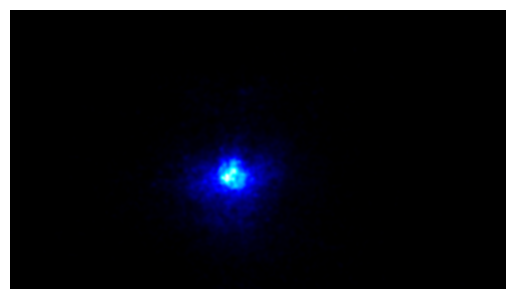

In [16]:
# Reload heatmap with Gaussian blur
heatmap = np.zeros((720, 1280), dtype=np.float32)

for point in gaze_points:
    x, y = int(point[0]), int(point[1])
    if 0 <= x < 1280 and 0 <= y < 720:
        heatmap[y, x] += 1

# Apply Gaussian blur
heatmap = cv2.GaussianBlur(heatmap, (25, 25), 0)

# Normalize and apply colormap
heatmap = cv2.normalize(heatmap, None, 0, 255, cv2.NORM_MINMAX)
heatmap = np.uint8(heatmap)
heatmap_colored = cv2.applyColorMap(heatmap, cv2.COLORMAP_HOT)  # Switch to a "hot" colormap for better visibility

# Display or save the improved heatmap
cv2.imwrite('eye-tracking/sub_0FJ87G/exports/improved_gaze_heatmap.jpg', heatmap_colored)
plt.imshow(heatmap_colored)
plt.axis('off')
plt.show()

In [17]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Reload gaze data and generate heatmap
heatmap = np.zeros((720, 1280), dtype=np.float32)

for point in gaze_points:
    x, y = int(point[0]), int(point[1])
    if 0 <= x < 1280 and 0 <= y < 720:
        heatmap[y, x] += 1

# Apply Gaussian blur to smooth out the heatmap
heatmap_blurred = cv2.GaussianBlur(heatmap, (25, 25), 0)

# Normalize to [0,255] and change colormap to increase visibility
heatmap_normalized = cv2.normalize(heatmap_blurred, None, 0, 255, cv2.NORM_MINMAX)
heatmap_colored = cv2.applyColorMap(np.uint8(heatmap_normalized), cv2.COLORMAP_JET)

# Load a sample frame to overlay
# cap = cv2.VideoCapture('000/world.mp4')
_, sample_frame = cap.read()
cap.release()

# Resize heatmap to match the sample frame (optional if sizes differ)
heatmap_resized = cv2.resize(heatmap_colored, (sample_frame.shape[1], sample_frame.shape[0]))

# Overlay heatmap on the frame
overlay = cv2.addWeighted(sample_frame, 0.6, heatmap_resized, 0.4, 0)

# Display the overlay
plt.figure(figsize=(10, 6))
plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Gaze Heatmap Overlay on Video Frame')
plt.show()

# Optionally, save the overlay image
cv2.imwrite('eye-tracking/sub_0FJ87G/exports/gaze_heatmap_overlay.jpg', overlay)


AttributeError: 'NoneType' object has no attribute 'shape'

In [18]:


# Load gaze data
# gaze_data = pd.read_csv('000/gaze_positions.csv')

# # Normalize gaze points to match frame resolution
# gaze_data['norm_x'] = gaze_data['norm_pos_x'] * 1280  # Adjust to your video resolution width
# gaze_data['norm_y'] = (1 - gaze_data['norm_pos_y']) * 720  # Adjust for height

# # Load video
# cap = cv2.VideoCapture('000/world.mp4')
fps = int(cap.get(cv2.CAP_PROP_FPS))
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Set up video writer for output
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter('eye-tracking/sub_0FJ87G/exports/gaze_overlay_video.mp4', fourcc, fps, (frame_width, frame_height))

frame_idx = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Filter gaze points for the current frame
    frame_gaze_data = gaze_data[gaze_data['world_index'] == frame_idx]

    # Initialize heatmap for the frame
    heatmap = np.zeros((720, 1280), dtype=np.float32)  # Based on normalized resolution

    for _, row in frame_gaze_data.iterrows():
        x, y = int(row['norm_x']), int(row['norm_y'])
        if 0 <= x < 1280 and 0 <= y < 720:
            heatmap[y, x] += 1

    # Apply Gaussian blur for smoother heatmap
    heatmap = cv2.GaussianBlur(heatmap, (25, 25), 0)

    # Normalize and apply colormap
    heatmap = cv2.normalize(heatmap, None, 0, 255, cv2.NORM_MINMAX)
    heatmap_colored = cv2.applyColorMap(np.uint8(heatmap), cv2.COLORMAP_JET)

    # **Resize heatmap to match the frame size**
    heatmap_colored_resized = cv2.resize(heatmap_colored, (frame_width, frame_height))

    # Overlay heatmap on the video frame
    overlay = cv2.addWeighted(frame, 0.6, heatmap_colored_resized, 0.4, 0)

    # Save frame with overlay
    out.write(overlay)

    frame_idx += 1

cap.release()
out.release()
cv2.destroyAllWindows()



# IMPORTANT: 

**This one works and saved unadjusted gazes on old video:** 

In [6]:

# # Load gaze data
# gaze_data = pd.read_csv('000/gaze_positions.csv')

# # Normalize gaze points to match frame resolution
# gaze_data['norm_x'] = gaze_data['norm_pos_x'] * 1280  # Adjust to your video resolution width
# gaze_data['norm_y'] = (1 - gaze_data['norm_pos_y']) * 720  # Adjust for height
import cv2
import numpy as np
import pandas as pd  # 如果使用了 pandas

gaze_data['norm_x'] = gaze_data['norm_pos_x'] * 640
gaze_data['norm_y'] = (1 - gaze_data['norm_pos_y']) * 480

# # Load video
cap = cv2.VideoCapture('/Users/jiaonahu/Desktop/pupil_script/world_01_fixed/world.mp4')
fps = int(cap.get(cv2.CAP_PROP_FPS))
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Set up video writer
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter('/Users/jiaonahu/Documents/eye-tracking/sub_RJ70HQ/exports/000/gaze_overlay_video.mp4', fourcc, fps, (frame_width, frame_height))

frame_idx = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Debug: Confirm frame is being read
    print(f"Processing frame {frame_idx} / {frame_count}")

    # Filter gaze points for the current frame
    frame_gaze_data = gaze_data[gaze_data['world_index'] == frame_idx]

    if frame_gaze_data.empty:
        print(f"No gaze data for frame {frame_idx}")
    else:
        # Debug: Print number of gaze points
        print(f"Gaze points for frame {frame_idx}: {len(frame_gaze_data)}")

    # Initialize heatmap for the frame
    heatmap = np.zeros((480, 640), dtype=np.float32)

    for _, row in frame_gaze_data.iterrows():
        x, y = int(row['norm_x']), int(row['norm_y'])
        if 0 <= x < 640 and 0 <= y < 480:
            heatmap[y, x] += 1

    # Apply Gaussian blur and normalize heatmap
    heatmap = cv2.GaussianBlur(heatmap, (25, 25), 0)
    heatmap = cv2.normalize(heatmap, None, 0, 255, cv2.NORM_MINMAX)
    heatmap_colored = cv2.applyColorMap(np.uint8(heatmap), cv2.COLORMAP_JET)

    # Resize heatmap to match frame size
    heatmap_colored_resized = cv2.resize(heatmap_colored, (frame_width, frame_height))

    # Overlay heatmap on frame
    overlay = cv2.addWeighted(frame, 0.6, heatmap_colored_resized, 0.4, 0)

    # Write frame to output
    out.write(overlay)
    frame_idx += 1

cap.release()
out.release()
cv2.destroyAllWindows()


Processing frame 0 / 30953
No gaze data for frame 0
Processing frame 1 / 30953
Gaze points for frame 1: 3
Processing frame 2 / 30953
Gaze points for frame 2: 2
Processing frame 3 / 30953
Gaze points for frame 3: 2
Processing frame 4 / 30953
Gaze points for frame 4: 2
Processing frame 5 / 30953
Gaze points for frame 5: 2
Processing frame 6 / 30953
Gaze points for frame 6: 2
Processing frame 7 / 30953
Gaze points for frame 7: 1
Processing frame 8 / 30953
Gaze points for frame 8: 3
Processing frame 9 / 30953
Gaze points for frame 9: 2
Processing frame 10 / 30953
Gaze points for frame 10: 1
Processing frame 11 / 30953
Gaze points for frame 11: 3
Processing frame 12 / 30953
Gaze points for frame 12: 2
Processing frame 13 / 30953
Gaze points for frame 13: 2
Processing frame 14 / 30953
Gaze points for frame 14: 2
Processing frame 15 / 30953
Gaze points for frame 15: 2
Processing frame 16 / 30953
Gaze points for frame 16: 2
Processing frame 17 / 30953
Gaze points for frame 17: 2
Processing fra

**This is version with old video and shifted gazes by 3 cm to the left**

Now lets shift the gazes 3 cm on x axis

1. if x is less than 0 then add white field to frame



In [22]:
# shift gaze x coordinates by 3 cm in negative direction

shifted_gaze_data = gaze_data.copy()
shifted_gaze_data['norm_pos_x'] -= 0.03 / 0.128  # Convert
shifted_gaze_data['norm_x'] = shifted_gaze_data['norm_pos_x'] * 1280
# are any values negative? Meaning they are outside of the existing video frame
print((shifted_gaze_data['norm_x'] < 0).any())

# show minimum x value
print(shifted_gaze_data['norm_x'].min())

True
-128300.0


In [23]:
# # Load video
cap = cv2.VideoCapture('eye-tracking/sub_0FJ87G/world.mp4')
fps = int(cap.get(cv2.CAP_PROP_FPS))
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Set up video writer
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter('eye-tracking/sub_0FJ87G/exports/shifted_gaze_overlay_video.mp4', fourcc, fps, (frame_width, frame_height))

frame_idx = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Debug: Confirm frame is being read
    print(f"Processing frame {frame_idx} / {frame_count}")

    # Filter gaze points for the current frame
    frame_gaze_data = shifted_gaze_data[shifted_gaze_data['world_index'] == frame_idx]

    if frame_gaze_data.empty:
        print(f"No gaze data for frame {frame_idx}")
    else:
        # Debug: Print number of gaze points
        print(f"Gaze points for frame {frame_idx}: {len(frame_gaze_data)}")

    # Initialize heatmap for the frame
    heatmap = np.zeros((720, 1280), dtype=np.float32)

    for _, row in frame_gaze_data.iterrows():
        x, y = int(row['norm_x']), int(row['norm_y'])
        if 0 <= x < 1280 and 0 <= y < 720:
            heatmap[y, x] += 1

    # Apply Gaussian blur and normalize heatmap
    heatmap = cv2.GaussianBlur(heatmap, (25, 25), 0)
    heatmap = cv2.normalize(heatmap, None, 0, 255, cv2.NORM_MINMAX)
    heatmap_colored = cv2.applyColorMap(np.uint8(heatmap), cv2.COLORMAP_JET)

    # Resize heatmap to match frame size
    heatmap_colored_resized = cv2.resize(heatmap_colored, (frame_width, frame_height))

    # Overlay heatmap on frame
    overlay = cv2.addWeighted(frame, 0.6, heatmap_colored_resized, 0.4, 0)

    # Write frame to output
    out.write(overlay)
    frame_idx += 1

cap.release()
out.release()
cv2.destroyAllWindows()

Processing frame 0 / 34403
Gaze points for frame 0: 1
Processing frame 1 / 34403
Gaze points for frame 1: 2
Processing frame 2 / 34403
Gaze points for frame 2: 2
Processing frame 3 / 34403
Gaze points for frame 3: 2
Processing frame 4 / 34403
Gaze points for frame 4: 3
Processing frame 5 / 34403
Gaze points for frame 5: 1
Processing frame 6 / 34403
Gaze points for frame 6: 2
Processing frame 7 / 34403
Gaze points for frame 7: 2
Processing frame 8 / 34403
Gaze points for frame 8: 1
Processing frame 9 / 34403
Gaze points for frame 9: 2
Processing frame 10 / 34403
Gaze points for frame 10: 3
Processing frame 11 / 34403
Gaze points for frame 11: 3
Processing frame 12 / 34403
Gaze points for frame 12: 2
Processing frame 13 / 34403
Gaze points for frame 13: 2
Processing frame 14 / 34403
Gaze points for frame 14: 2
Processing frame 15 / 34403
Gaze points for frame 15: 1
Processing frame 16 / 34403
Gaze points for frame 16: 2
Processing frame 17 / 34403
Gaze points for frame 17: 3
Processing f

# Part two

=================

**UPGRADE: with added polyline to track the path of the gaze**

In [41]:
# with added polyline to track the path of the gaze

import cv2
import numpy as np
import pandas as pd

# Load video
cap = cv2.VideoCapture('eye-tracking/sub_0FJ87G/world.mp4')
fps = int(cap.get(cv2.CAP_PROP_FPS))
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Set up video writer
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter('eye-tracking/sub_0FJ87G/exports/shifted_gaze_overlay_video_polypath.mp4', fourcc, fps, (frame_width, frame_height))

# Initialize the gaze path list
gaze_path = []

frame_idx = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Debug: Confirm frame is being read
    print(f"Processing frame {frame_idx} / {frame_count}")

    # Filter gaze points for the current frame
    frame_gaze_data = shifted_gaze_data[shifted_gaze_data['world_index'] == frame_idx]

    if frame_gaze_data.empty:
        print(f"No gaze data for frame {frame_idx}")
    else:
        # Debug: Print number of gaze points
        print(f"Gaze points for frame {frame_idx}: {len(frame_gaze_data)}")
        # position for the frame if multiple points exist (take first point for simplicity)
        #avg_x = int(frame_gaze_data['norm_x'][0])
        #avg_y = int(frame_gaze_data['norm_y'][0])

        #gaze_path.append([avg_x, avg_y])
        

    # Initialize heatmap for the frame
    heatmap = np.zeros((720, 1280), dtype=np.float32)

    for _, row in frame_gaze_data.iterrows():
        x, y = int(row['norm_x']), int(row['norm_y'])
        if 0 <= x < 1280 and 0 <= y < 720:
            heatmap[y, x] += 1

    # find x and y location of peak value and append to gaze path
    y, x = np.unravel_index(heatmap.argmax(), heatmap.shape)
    gaze_path.append([x, y])

    # Apply Gaussian blur and normalize heatmap
    heatmap = cv2.GaussianBlur(heatmap, (25, 25), 0)
    heatmap = cv2.normalize(heatmap, None, 0, 255, cv2.NORM_MINMAX)
    heatmap_colored = cv2.applyColorMap(np.uint8(heatmap), cv2.COLORMAP_JET)

    # Resize heatmap to match frame size
    heatmap_colored_resized = cv2.resize(heatmap_colored, (frame_width, frame_height))

    # Overlay heatmap on frame
    overlay = cv2.addWeighted(frame, 0.6, heatmap_colored_resized, 0.4, 0)

    # Draw polyline for gaze path if available
    if len(gaze_path) > 1:
        # Convert gaze_path to a numpy array of type int32
        pts = np.array(gaze_path, dtype=np.int32)
        overlay = cv2.polylines(overlay, [pts], isClosed=False, color=(0, 255, 0), thickness=2)

    # Write frame to output
    out.write(overlay)
    frame_idx += 1

cap.release()
out.release()
cv2.destroyAllWindows()

Processing frame 0 / 34403
Gaze points for frame 0: 1
Processing frame 1 / 34403
Gaze points for frame 1: 2
Processing frame 2 / 34403
Gaze points for frame 2: 2
Processing frame 3 / 34403
Gaze points for frame 3: 2
Processing frame 4 / 34403
Gaze points for frame 4: 3
Processing frame 5 / 34403
Gaze points for frame 5: 1
Processing frame 6 / 34403
Gaze points for frame 6: 2
Processing frame 7 / 34403
Gaze points for frame 7: 2
Processing frame 8 / 34403
Gaze points for frame 8: 1
Processing frame 9 / 34403
Gaze points for frame 9: 2
Processing frame 10 / 34403
Gaze points for frame 10: 3
Processing frame 11 / 34403
Gaze points for frame 11: 3
Processing frame 12 / 34403
Gaze points for frame 12: 2
Processing frame 13 / 34403
Gaze points for frame 13: 2
Processing frame 14 / 34403
Gaze points for frame 14: 2
Processing frame 15 / 34403
Gaze points for frame 15: 1
Processing frame 16 / 34403
Gaze points for frame 16: 2
Processing frame 17 / 34403
Gaze points for frame 17: 3
Processing f

In [27]:
annotation_timestamps = np.load('eye-tracking/sub_0FJ87G/annotation_timestamps.npy')

annotation_timestamps

array([], dtype=float64)

In [33]:
gaze_path

[[373, 397],
 [335, 447],
 [386, 390],
 [391, 390],
 [353, 397],
 [580, 284],
 [477, 316],
 [382, 381],
 [375, 382],
 [361, 392],
 [341, 407],
 [350, 409],
 [350, 444],
 [311, 437],
 [340, 416],
 [183, 396],
 [419, 419],
 [387, 464],
 [302, 398],
 [299, 430],
 [315, 448],
 [288, 479],
 [280, 506],
 [300, 508],
 [380, 466],
 [266, 504],
 [295, 455],
 [267, 512],
 [272, 511],
 [288, 502],
 [314, 466],
 [311, 435],
 [321, 426],
 [325, 394],
 [336, 408],
 [352, 388],
 [367, 381],
 [365, 380],
 [363, 381],
 [333, 413],
 [374, 388],
 [355, 395],
 [352, 401],
 [342, 410],
 [322, 416],
 [321, 417],
 [276, 441],
 [293, 427],
 [273, 429],
 [248, 435],
 [233, 439],
 [233, 438],
 [233, 436],
 [234, 435],
 [240, 434],
 [262, 450],
 [261, 438],
 [264, 437],
 [264, 436],
 [267, 436],
 [267, 438],
 [266, 439],
 [277, 442],
 [217, 489],
 [248, 483],
 [220, 488],
 [93, 454],
 [107, 454],
 [251, 446],
 [246, 445],
 [246, 436],
 [249, 431],
 [247, 425],
 [246, 422],
 [248, 417],
 [239, 413],
 [237, 409],


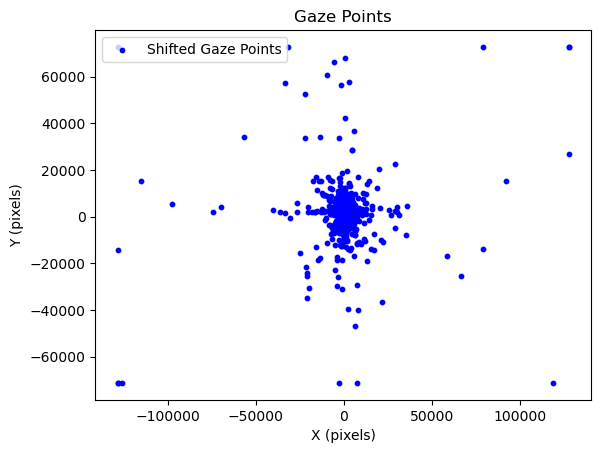

In [39]:
import numpy as np
import matplotlib.pyplot as plt

# Convert gaze_path list to a NumPy array
gaze_path_array = np.array(gaze_path)

#plt.scatter(gaze_path_array[:, 0], gaze_path_array[:, 1], c='r', s=10, label='Gaze Path')
plt.scatter(shifted_gaze_data['norm_x'], shifted_gaze_data['norm_y'], c='b', s=10, label='Shifted Gaze Points')
plt.xlabel('X (pixels)')
plt.ylabel('Y (pixels)')
plt.title('Gaze Points')
plt.legend()
plt.show()

**Video with heatmap (not working properly)**



In [12]:

# Load gaze data
gaze_data = pd.read_csv('000/gaze_positions.csv')

# Normalize gaze points to match frame resolution
gaze_data['norm_x'] = gaze_data['norm_pos_x'] * 1280  # Adjust to video resolution
gaze_data['norm_y'] = (1 - gaze_data['norm_pos_y']) * 720  # Flip Y axis

# Load video
cap = cv2.VideoCapture('000/world.mp4')
fps = int(cap.get(cv2.CAP_PROP_FPS))
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Debug: Verify Video Capture Information
print(f"Video Properties: {frame_count} frames, {fps} FPS, {frame_width}x{frame_height} resolution")

# Set up video writer
fourcc = cv2.VideoWriter_fourcc(*'avc1')  # 'avc1' is H.264, more compatible with QuickTime
out = cv2.VideoWriter('gaze_overlay_video.mp4', fourcc, fps, (frame_width, frame_height))

frame_idx = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    print(f"Processing frame {frame_idx} / {frame_count}")
    
    # Filter gaze points for the current frame
    frame_gaze_data = gaze_data[gaze_data['world_index'] == frame_idx]

    if frame_gaze_data.empty:
        print(f"No gaze data for frame {frame_idx}")
        heatmap = np.zeros((720, 1280), dtype=np.float32)  # No heatmap, skip
    else:
        # Create heatmap for the frame
        heatmap = np.zeros((720, 1280), dtype=np.float32)
        for _, row in frame_gaze_data.iterrows():
            x, y = int(row['norm_x']), int(row['norm_y'])
            if 0 <= x < 1280 and 0 <= y < 720:
                heatmap[y, x] += 1
        
        # Gaussian blur for smoother heatmap
        heatmap = cv2.GaussianBlur(heatmap, (25, 25), 0)

    # Normalize and apply colormap
    heatmap = cv2.normalize(heatmap, None, 0, 255, cv2.NORM_MINMAX)
    heatmap_colored = cv2.applyColorMap(np.uint8(heatmap), cv2.COLORMAP_JET)

    # Resize heatmap to match the frame dimensions
    heatmap_colored_resized = cv2.resize(heatmap_colored, (frame_width, frame_height))

    # Overlay heatmap on the video frame
    overlay = cv2.addWeighted(frame, 0.6, heatmap_colored_resized, 0.4, 0)

    # Write frame to output video
    out.write(overlay)
    print(f"Frame {frame_idx} written to output.")

    frame_idx += 1

cap.release()
out.release()
cv2.destroyAllWindows()

print("Video processing completed.")


Video Properties: 1918 frames, 29 FPS, 640x480 resolution
Processing frame 0 / 1918
Frame 0 written to output.
Processing frame 1 / 1918
Frame 1 written to output.
Processing frame 2 / 1918
Frame 2 written to output.
Processing frame 3 / 1918
Frame 3 written to output.
Processing frame 4 / 1918
Frame 4 written to output.
Processing frame 5 / 1918
Frame 5 written to output.
Processing frame 6 / 1918
Frame 6 written to output.
Processing frame 7 / 1918
Frame 7 written to output.
Processing frame 8 / 1918
Frame 8 written to output.
Processing frame 9 / 1918
Frame 9 written to output.
Processing frame 10 / 1918
Frame 10 written to output.
Processing frame 11 / 1918
Frame 11 written to output.
Processing frame 12 / 1918
Frame 12 written to output.
Processing frame 13 / 1918
Frame 13 written to output.
Processing frame 14 / 1918
Frame 14 written to output.
Processing frame 15 / 1918
Frame 15 written to output.
Processing frame 16 / 1918
Frame 16 written to output.
Processing frame 17 / 1918


In [13]:
import pandas as pd
import cv2
import numpy as np

# Load gaze data
gaze_data = pd.read_csv('000/gaze_positions.csv')

# Normalize gaze points to match actual frame resolution (640x480)
gaze_data['norm_x'] = gaze_data['norm_pos_x'] * 640  # Adjust to match frame width
gaze_data['norm_y'] = (1 - gaze_data['norm_pos_y']) * 480  # Adjust to match frame height

# Load video
cap = cv2.VideoCapture('000/world.mp4')
fps = int(cap.get(cv2.CAP_PROP_FPS))
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Confirm resolution
print(f"Video Properties: {frame_count} frames, {fps} FPS, {frame_width}x{frame_height} resolution")

# Set up video writer with the correct resolution
fourcc = cv2.VideoWriter_fourcc(*'avc1')  # H.264 for QuickTime compatibility
out = cv2.VideoWriter('gaze_overlay_video.mp4', fourcc, fps, (frame_width, frame_height))

frame_idx = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    print(f"Processing frame {frame_idx} / {frame_count}")
    
    # Filter gaze points for the current frame
    frame_gaze_data = gaze_data[gaze_data['world_index'] == frame_idx]

    # Initialize heatmap for the frame
    heatmap = np.zeros((480, 640), dtype=np.float32)  # Match actual frame size

    if not frame_gaze_data.empty:
        for _, row in frame_gaze_data.iterrows():
            x, y = int(row['norm_x']), int(row['norm_y'])
            if 0 <= x < 640 and 0 <= y < 480:
                heatmap[y, x] += 1

        # Apply Gaussian blur for smoother heatmap
        heatmap = cv2.GaussianBlur(heatmap, (25, 25), 0)

    # Normalize and apply colormap
    heatmap = cv2.normalize(heatmap, None, 0, 255, cv2.NORM_MINMAX)
    heatmap_colored = cv2.applyColorMap(np.uint8(heatmap), cv2.COLORMAP_JET)

    # Overlay heatmap on the video frame
    overlay = cv2.addWeighted(frame, 0.6, heatmap_colored, 0.4, 0)

    # Write frame to output video
    out.write(overlay)
    print(f"Frame {frame_idx} written to output.")

    frame_idx += 1

cap.release()
out.release()
cv2.destroyAllWindows()

print("Video processing completed and properly finalized.")


Video Properties: 1918 frames, 29 FPS, 640x480 resolution
Processing frame 0 / 1918
Frame 0 written to output.
Processing frame 1 / 1918
Frame 1 written to output.
Processing frame 2 / 1918
Frame 2 written to output.
Processing frame 3 / 1918
Frame 3 written to output.
Processing frame 4 / 1918
Frame 4 written to output.
Processing frame 5 / 1918
Frame 5 written to output.
Processing frame 6 / 1918
Frame 6 written to output.
Processing frame 7 / 1918
Frame 7 written to output.
Processing frame 8 / 1918
Frame 8 written to output.
Processing frame 9 / 1918
Frame 9 written to output.
Processing frame 10 / 1918
Frame 10 written to output.
Processing frame 11 / 1918
Frame 11 written to output.
Processing frame 12 / 1918
Frame 12 written to output.
Processing frame 13 / 1918
Frame 13 written to output.
Processing frame 14 / 1918
Frame 14 written to output.
Processing frame 15 / 1918
Frame 15 written to output.
Processing frame 16 / 1918
Frame 16 written to output.
Processing frame 17 / 1918


## Analysis

1. Load and Prepare Data
2. 

In [ ]:
# Functions

def load_data(gaze_file, event_file):
    """
    Load gaze data and event markers.

    Parameters:
    gaze_file (str): Path to gaze_positions.csv.
    event_file (str): Path to LSL event markers (CSV or similar).

    Returns:
    pd.DataFrame, pd.DataFrame: Gaze data and event markers.
    """
    gaze_data = pd.read_csv(gaze_file)
    event_data = pd.read_csv(event_file)

    return gaze_data, event_data

def filter_gaze_data(gaze_data):
    """
    Filter out invalid gaze data.

    Parameters:
    gaze_data (pd.DataFrame): Gaze data with columns ['timestamp', 'norm_pos_x', 'norm_pos_y', 'confidence'].

    Returns:
    pd.DataFrame: Filtered gaze data.
    """
    # Remove rows with low confidence or NaN values
    filtered_gaze = gaze_data[gaze_data['confidence'] > 0.6].dropna(subset=['norm_pos_x', 'norm_pos_y'])

    return filtered_gaze

def align_gaze_with_events(gaze_data, event_data):
    """
    Align gaze data with event markers.

    Parameters:
    gaze_data (pd.DataFrame): Filtered gaze data.
    event_data (pd.DataFrame): Event markers with columns ['timestamp', 'event'].

    Returns:
    dict: Dictionary where keys are event names and values are gaze data DataFrames for each event.
    """
    event_segments = {}
    event_timestamps = event_data['timestamp'].values

    for i, event in event_data.iterrows():
        start_time = event['timestamp']
        end_time = event_timestamps[i + 1] if i + 1 < len(event_timestamps) else gaze_data['timestamp'].max()

        segment = gaze_data[(gaze_data['timestamp'] >= start_time) & (gaze_data['timestamp'] < end_time)]
        event_segments[event['event']] = segment

    return event_segments


def generate_heatmap(gaze_data, resolution=(640, 480), blur_kernel=(25, 25)):
    """
    Generate a heatmap from gaze data.

    Parameters:
    gaze_data (pd.DataFrame): Gaze data with normalized x and y positions.
    resolution (tuple): Resolution of the output heatmap.
    blur_kernel (tuple): Kernel size for Gaussian blur.

    Returns:
    np.ndarray: Heatmap image.
    """
    heatmap = np.zeros(resolution, dtype=np.float32)

    for _, row in gaze_data.iterrows():
        x = int(row['norm_pos_x'] * resolution[0])
        y = int(row['norm_pos_y'] * resolution[1])

        if 0 <= x < resolution[0] and 0 <= y < resolution[1]:
            heatmap[y, x] += 1

    heatmap = cv2.GaussianBlur(heatmap, blur_kernel, 0)
    heatmap = cv2.normalize(heatmap, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    return cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

def identify_fixations(gaze_data, velocity_threshold=0.05):
    """
    Identify fixations in gaze data based on velocity.

    Parameters:
    gaze_data (pd.DataFrame): Gaze data with timestamps and positions.
    velocity_threshold (float): Threshold for fixation detection.

    Returns:
    list of dicts: Fixations with start, end, and duration.
    """
    fixations = []
    start_idx = None

    for i in range(1, len(gaze_data)):
        prev = gaze_data.iloc[i - 1]
        curr = gaze_data.iloc[i]

        velocity = np.sqrt((curr['norm_pos_x'] - prev['norm_pos_x'])**2 + (curr['norm_pos_y'] - prev['norm_pos_y'])**2) / (curr['timestamp'] - prev['timestamp'])

        if velocity < velocity_threshold:
            if start_idx is None:
                start_idx = i - 1
        else:
            if start_idx is not None:
                fixation = {
                    'start': gaze_data.iloc[start_idx]['timestamp'],
                    'end': prev['timestamp'],
                    'duration': prev['timestamp'] - gaze_data.iloc[start_idx]['timestamp']
                }
                fixations.append(fixation)
                start_idx = None

    return fixations

def analyze_pupil_dilation(event_segments):
    """
    Analyze and plot pupil dilation across different conditions.

    Parameters:
    event_segments (dict): Dictionary of gaze data segments for each event.

    Returns:
    dict: Average pupil size per condition.
    """
    pupil_summary = {}

    for event, segment in event_segments.items():
        if 'pupil_diameter' in segment.columns:
            avg_pupil_size = segment['pupil_diameter'].mean()
            pupil_summary[event] = avg_pupil_size

            # Plot pupil size over time for each condition
            plt.figure(figsize=(10, 5))
            plt.plot(segment['timestamp'], segment['pupil_diameter'], label=f'Pupil Size - {event}')
            plt.xlabel('Time (s)')
            plt.ylabel('Pupil Diameter (mm)')
            plt.title(f'Pupil Dilation - {event}')
            plt.legend()
            plt.show()

    return pupil_summary




In [ ]:
def visualize_condition_heatmaps(event_segments, resolution=(640, 480), image_map=None):
    """
    Generate and display heatmaps for each condition, optionally overlaying on images.

    Parameters:
    event_segments (dict): Gaze data segments for each event.
    resolution (tuple): Resolution for the heatmaps.
    image_map (dict): Optional dictionary mapping event names to background images.

    Returns:
    None
    """
    for event, segment in event_segments.items():
        heatmap = generate_heatmap(segment, resolution=resolution)
        
        if image_map and event in image_map:
            # Overlay heatmap on background image
            background = cv2.imread(image_map[event])
            background_resized = cv2.resize(background, resolution)
            overlay = cv2.addWeighted(background_resized, 0.5, heatmap, 0.5, 0)
            
            plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
            plt.title(f'Heatmap Overlay - {event}')
        else:
            plt.imshow(heatmap)
            plt.title(f'Heatmap - {event}')
        
        plt.axis('off')
        plt.show()


In [ ]:
def run_full_analysis(gaze_file, event_file, resolution=(640, 480), image_map=None):
    """
    Run full analysis pipeline for VR eye-tracking experiment.

    Parameters:
    gaze_file (str): Path to gaze_positions.csv.
    event_file (str): Path to LSL event markers.
    resolution (tuple): Heatmap resolution.
    image_map (dict): Optional map of conditions to background images.

    Returns:
    None
    """
    gaze_data, event_data = load_data(gaze_file, event_file)
    gaze_data = filter_gaze_data(gaze_data)
    event_segments = align_gaze_with_events(gaze_data, event_data)
    
    print("\n--- Analyzing Pupil Dilation ---")
    pupil_summary = analyze_pupil_dilation(event_segments)
    print("Pupil Dilation Summary:", pupil_summary)

    print("\n--- Visualizing Heatmaps ---")
    visualize_condition_heatmaps(event_segments, resolution=resolution, image_map=image_map)


Implement analysis:

1. Load and preprocess data.
2. Filter gaze data.
3. Align gaze data with events.
4. Heatmap for each condition.
5. Fixation analysis.
6. Pupil dilation analysis.
7. Visualisation (automated).


In [ ]:
# Paths to data files
gaze_file = 'path_to_gaze_positions.csv'
event_file = 'path_to_event_markers.csv'

# Optional: Map conditions to images
image_map = {
    'Condition_A': 'path_to_image_A.jpg',
    'Condition_B': 'path_to_image_B.jpg'
}

run_full_analysis(gaze_file, event_file, resolution=(640, 480), image_map=image_map)

**Statistical Analysis**

In [ ]:
from scipy.stats import ttest_ind, f_oneway

def compare_conditions(event_segments, metric='pupil_diameter'):
    """
    Perform statistical comparisons across conditions.

    Parameters:
    event_segments (dict): Gaze data segments for each event.
    metric (str): The metric to compare ('pupil_diameter', 'fixation_duration').

    Returns:
    dict: Statistical comparison results.
    """
    data = {event: segment[metric].dropna() for event, segment in event_segments.items() if metric in segment}
    
    if len(data) < 2:
        print("Not enough conditions for comparison.")
        return None

    results = {}
    conditions = list(data.keys())
    
    # Pairwise t-tests
    for i in range(len(conditions)):
        for j in range(i + 1, len(conditions)):
            t_stat, p_val = ttest_ind(data[conditions[i]], data[conditions[j]], equal_var=False)
            results[f'{conditions[i]} vs {conditions[j]}'] = {'t_stat': t_stat, 'p_value': p_val}

    # ANOVA
    f_stat, p_val_anova = f_oneway(*data.values())
    results['ANOVA'] = {'f_stat': f_stat, 'p_value': p_val_anova}

    return results


In [ ]:
# Generate reporting

def export_report(pupil_summary, fixation_summary, comparison_results, output_path='report.csv'):
    """
    Export analysis summary and statistical comparisons to CSV.

    Parameters:
    pupil_summary (dict): Average pupil size per condition.
    fixation_summary (dict): Average fixation duration per condition.
    comparison_results (dict): Statistical comparison results.
    output_path (str): Path to save the report.

    Returns:
    None
    """
    import csv

    with open(output_path, mode='w', newline='') as file:
        writer = csv.writer(file)
        
        writer.writerow(['Pupil Dilation Summary'])
        writer.writerow(['Condition', 'Average Pupil Diameter'])
        for condition, avg_pupil in pupil_summary.items():
            writer.writerow([condition, avg_pupil])
        
        writer.writerow([])
        writer.writerow(['Fixation Summary'])
        writer.writerow(['Condition', 'Average Fixation Duration'])
        for condition, avg_fixation in fixation_summary.items():
            writer.writerow([condition, avg_fixation])

        writer.writerow([])
        writer.writerow(['Statistical Comparisons'])
        writer.writerow(['Comparison', 'Metric', 'Statistic', 'p-value'])
        for comparison, stats in comparison_results.items():
            writer.writerow([comparison, 't-stat' if 't_stat' in stats else 'f-stat', stats.get('t_stat', stats.get('f_stat')), stats['p_value']])


## Analysis in class plus group-level

In [ ]:
class SubjectAnalysis:
    def __init__(self, subject_id, gaze_file, event_file):
         """
    Initialize the SubjectAnalysis class. This is important
    You need to structrue your onset files correctly. 

    Parameters:
    -----------
    subject_id : str
        A unique identifier for the subject (e.g., 'sub01').
        This helps in tracking and organizing data for each participant separately.
    
    gaze_file : str
        Path to the CSV file containing the subject's gaze data.
        This file typically includes information like:
        - Timestamp of each gaze sample.
        - Gaze position (normalized x and y coordinates).
        - Pupil diameter.
        - Confidence score for gaze validity.
        Example:
        | timestamp | norm_pos_x | norm_pos_y | pupil_diameter | confidence |
        |-----------|------------|------------|----------------|------------|
        |   1.024   |    0.45    |    0.55    |      3.1       |    0.95    |
    
    event_file : str
        Path to the CSV file containing the event markers for this subject.
        This file records the timing and type of experimental events.
        It typically includes:
        - `timestamp`: The time when an event occurred.
        - `event`: The name or label of the event (e.g., 'Condition_A').
        Example:
        | timestamp | event       |
        |-----------|-------------|
        |    5.023  | Condition_A |
        |   15.349  | Condition_B |
    
    Attributes:
    -----------
    self.subject_id : str
        Stores the subject ID for reference within the class.
    
    self.gaze_data : pd.DataFrame
        A pandas DataFrame containing the gaze data loaded from `gaze_file`.
    
    self.event_data : pd.DataFrame
        A pandas DataFrame containing the event markers loaded from `event_file`.
    
    self.event_segments : dict
        An empty dictionary initialized to store segmented gaze data for each event.
        This will be populated later during analysis.
    """
        self.subject_id = subject_id
        self.gaze_data, self.event_data = self.load_data(gaze_file, event_file)
        self.event_segments = {}

    def load_data(self, gaze_file, event_file):
        """Load gaze and event data."""
        gaze_data = pd.read_csv(gaze_file)
        event_data = pd.read_csv(event_file)
        gaze_data['subject_id'] = self.subject_id  # Ensure subject info is included
        return gaze_data, event_data

    def filter_gaze_data(self):
        """Filter and clean gaze data."""
        self.gaze_data = self.gaze_data[self.gaze_data['confidence'] > 0.6].dropna(subset=['norm_pos_x', 'norm_pos_y'])

    def align_gaze_with_events(self):
        """Segment gaze data by event for this subject."""
        event_segments = {}
        event_timestamps = self.event_data['timestamp'].values

        for i, event in self.event_data.iterrows():
            start_time = event['timestamp']
            end_time = event_timestamps[i + 1] if i + 1 < len(event_timestamps) else self.gaze_data['timestamp'].max()

            segment = self.gaze_data[(self.gaze_data['timestamp'] >= start_time) & (self.gaze_data['timestamp'] < end_time)]
            event_segments[event['event']] = segment

        self.event_segments = event_segments
        
    def export_subject_data(self, output_path):
        """
        Export segmented event data for this subject to a CSV file.

        Parameters:
        output_path (str): Path to save the CSV file.

        Returns:
        None
        """
        all_segments = []
        for event, data in self.event_segments.items():
            data['event'] = event
            all_segments.append(data)

        subject_df = pd.concat(all_segments)
        subject_df.to_csv(output_path, index=False)
        print(f"Exported subject data for {self.subject_id} to {output_path}")

    def run_analysis(self):
        """Run heatmap, fixation, or pupil dilation analyses."""
        self.filter_gaze_data()
        self.align_gaze_with_events()
        # Additional analyses can be added here, e.g., generate heatmaps or analyze fixations.

        return self.event_segments


In [ ]:
# run subject-level

subject_ids = ['sub01', 'sub02', 'sub03']  # List of subjects
all_event_segments = []  # Store results for all subjects

for subject_id in subject_ids:
    print(f"Processing subject: {subject_id}")
    
    gaze_file = f'data/{subject_id}_gaze_positions.csv'
    event_file = f'data/{subject_id}_event_markers.csv'
    
    subject_analysis = SubjectAnalysis(subject_id, gaze_file, event_file)
    subject_analysis.run_analysis()
    
    # Export individual subject data to CSV for R
    subject_analysis.export_subject_data(f'exports/{subject_id}_processed.csv')


# Combine all subjects' data into one DataFrame
group_data = pd.concat(all_event_segments, ignore_index=True)

# Export combined group data to CSV
group_data.to_csv('group_data.csv', index=False)
print("Exported group-level data to group_data.csv")

# Optional: Export to Feather format for faster I/O
group_data.to_feather('group_data.feather')
print("Exported group-level data to group_data.feather")


In [ ]:
#Group Level

# LME model
import statsmodels.formula.api as smf

# Example: Analyze pupil dilation across conditions, accounting for subjects as a random effect
lme_model = smf.mixedlm("pupil_diameter ~ event", group_data, groups=group_data["subject_id"])
lme_results = lme_model.fit()

print(lme_results.summary())
